## Aim is to look at different datasets and test their suitability

I have 3 datasets
- ERA5
- ORAS5
- Climate Energy Indicator (CEI)

I have downloaded some data from 2020 for all of them

In [45]:
## load packages
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import glob
import cartopy.crs as ccrs
import os

## ERA5

In [38]:
## import data

ERA5 = xr.open_dataset("../Data/ERA5.nc")

In [47]:
ERA5

<xarray.Dataset> Size: 13MB
Dimensions:    (longitude: 59, latitude: 37, time: 366)
Coordinates:
  * longitude  (longitude) float32 236B -20.0 -19.75 -19.5 ... -6.0 -5.75 -5.5
  * latitude   (latitude) float32 148B 45.0 44.75 44.5 44.25 ... 36.5 36.25 36.0
  * time       (time) datetime64[ns] 3kB 2020-01-01 2020-01-02 ... 2020-12-31
Data variables:
    u10        (time, latitude, longitude) float64 6MB -2.333 -2.355 ... 2.061
    v10        (time, latitude, longitude) float64 6MB 11.23 11.06 ... -1.842
Attributes:
    Conventions:  CF-1.6
    history:      2024-04-04 14:27:10 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

In [99]:
np.hypot(0,15)

15.0

In [118]:
for i in np.arange(0, 5): #len(ERA5.time)):
    plt.figure(figsize=(10, 6))
    
    # Set up the map 
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([-20, -5.5, 45, 36])
    ax.gridlines(draw_labels=True)
    ax.coastlines()

    # colours for arrows
    col = np.hypot(ERA5.u10.isel(time=i), ERA5.v10.isel(time=i))
        
    # plot
    im = ax.quiver(ERA5.longitude, ERA5.latitude, ERA5.u10.isel(time=i), ERA5.v10.isel(time=i), col, units = 'width')
    qk = ax.quiverkey(im, 0.9, 1.1, 10, r'10 $\frac{m}{s}$', labelpos='E')
    plt.title(f'{str(ERA5.time[i].values)[0:10]}')
    plt.colorbar(im, ax = ax, label = r'Wind speed [$\frac{m}{s}$]', pad = 0.09);

    plt.savefig(f"Figures/ERA5_2020/{str(ERA5.time[i].values)[0:10]}.png")
    plt.close()

## ORAS5 

In [188]:
## import data
# I cannot do this because the lat and lons don't match and then I don't get data
ORAS5 = xr.merge([xr.open_dataset(f) for f in glob.glob('../Data/ORAS5/*.nc')], compat = 'override')

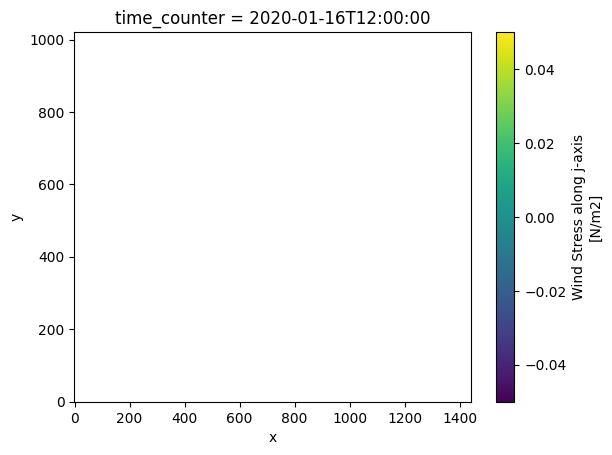

In [189]:
## has no data ... 
ORAS5.sometauy.isel(time_counter = 0).plot()

In [122]:
## just work with one variable at a time 
ORAS5_sub1 = xr.open_dataset("../Data/ORAS5/sometauy_control_monthly_highres_2D_202001_OPER_v0.1.nc")
ORAS5_sub2 = xr.open_dataset("../Data/ORAS5/sozotaux_control_monthly_highres_2D_202001_OPER_v0.1.nc")

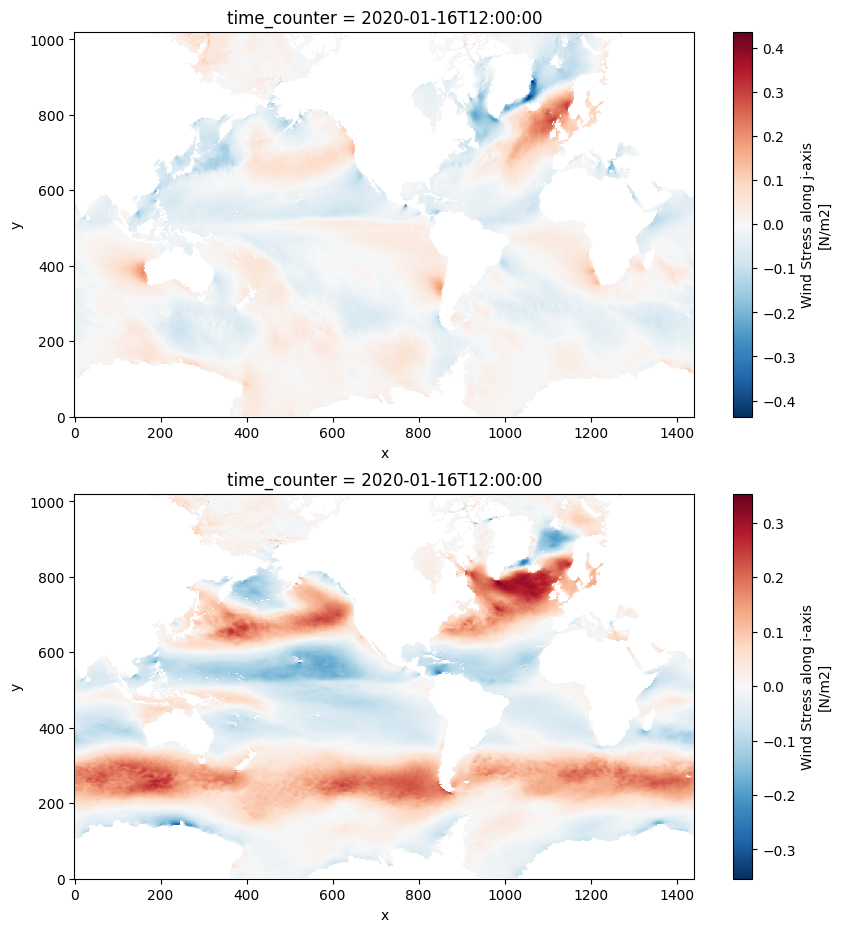

In [205]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize = (10,11))
ORAS5_sub1.sometauy.plot(ax=ax1)
ORAS5_sub2.sozotaux.plot(ax=ax2)
fig.savefig("Figures/ORAS5_2020/ORAS5_2020_01_overview_u_v.png")

In [128]:
# lats aren't the same
ORAS5_sub1.nav_lat == ORAS5_sub2.nav_lat

<xarray.DataArray 'nav_lat' (y: 1021, x: 1442)> Size: 1MB
array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])
Dimensions without coordinates: y, x

In [129]:
print(ORAS5_sub1.nav_lat.values)

[[-76.982346 -76.982346 -76.982346 ... -76.982346 -76.982346 -76.982346]
 [-76.92592  -76.92592  -76.92592  ... -76.92592  -76.92592  -76.92592 ]
 [-76.86924  -76.86924  -76.86924  ... -76.86924  -76.86924  -76.86924 ]
 ...
 [ 49.99831   49.998314  49.99831  ...  50.01901   49.99831   49.998314]
 [ 49.99831   49.998314  49.99831  ...  50.01901   49.99831   49.998314]
 [ 49.9933    49.993244  49.9933   ...  50.018654  49.9933    49.993244]]


In [130]:
print(ORAS5_sub1.nav_lon.values)

[[72.75     73.       73.25     ... 72.5      72.75     73.      ]
 [72.75     73.       73.25     ... 72.5      72.75     73.      ]
 [72.75     73.       73.25     ... 72.5      72.75     73.      ]
 ...
 [73.00004  73.       72.99996  ... 72.99722  73.00004  73.      ]
 [72.99996  73.       73.00004  ... 73.00278  72.99996  73.      ]
 [73.000404 73.       72.999596 ... 73.008995 73.000404 73.      ]]


In [131]:
print(ORAS5_sub2.nav_lat.values)

[[-77.010475 -77.010475 -77.010475 ... -77.010475 -77.010475 -77.010475]
 [-76.95416  -76.95416  -76.95416  ... -76.95416  -76.95416  -76.95416 ]
 [-76.89761  -76.89761  -76.89761  ... -76.89761  -76.89761  -76.89761 ]
 ...
 [ 49.99404   49.99404   50.004257 ...  50.004257  49.99404   49.99404 ]
 [ 49.99881   49.99881   50.00658  ...  50.00658   49.99881   49.99881 ]
 [ 49.99404   49.99404   50.004257 ...  50.004257  49.99404   49.99404 ]]


In [132]:
#for value in ORAS5_sub2.nav_lat.values:
#    print(value)

In [207]:
## build a 'fake dataset' with fixed lat and lon values and then fill with the x and y tau values
## get data into xarray with lat lon coordinates for easier use with function

lat = np.arange(0,1021)
lon = np.arange(0,1442)
y = ORAS5_sub1.sometauy.isel(time_counter = 0).to_numpy()
x = ORAS5_sub2.sozotaux.isel(time_counter = 0).to_numpy()

# build xarray
test = xr.Dataset({
    'y': xr.DataArray(
                data   = y,   # enter data here
                dims   = ['lat', 'lon'],
                coords = {
                    'lat': lat,
                    'lon': lon,
                    }, 
                attrs  = {
                    'var': 'sometauy'}
                ),
    'x': xr.DataArray(
                data   = x,   # enter data here
                dims   = ['lat', 'lon'],
                coords = {
                    'lat': lat,
                    'lon': lon,
                    }, 
                attrs  = {
                    'var': 'sozotaux'}
                )
                 },
    attrs = {'example_attr': 'something'}
)

In [192]:
test

<xarray.Dataset> Size: 12MB
Dimensions:  (lat: 1021, lon: 1442)
Coordinates:
  * lat      (lat) int64 8kB 0 1 2 3 4 5 6 ... 1015 1016 1017 1018 1019 1020
  * lon      (lon) int64 12kB 0 1 2 3 4 5 6 ... 1436 1437 1438 1439 1440 1441
Data variables:
    y        (lat, lon) float32 6MB nan nan nan nan nan ... nan nan nan nan nan
    x        (lat, lon) float32 6MB nan nan nan nan nan ... nan nan nan nan nan
Attributes:
    example_attr:  something

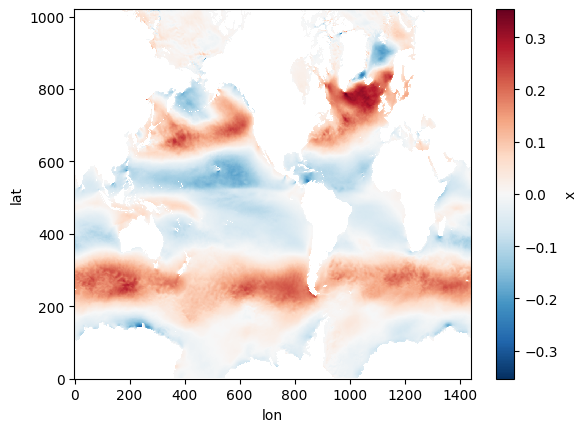

In [206]:
test.x.plot()

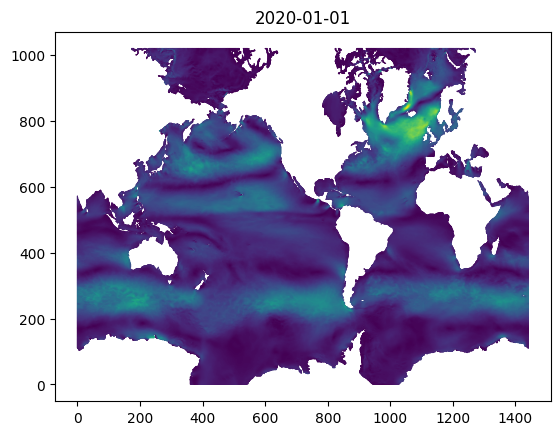

In [208]:
# considers x and y direction
M = np.hypot(test.x, test.y)
plt.quiver(test.lon, test.lat, test.x, test.y, M)
plt.title('2020-01-01')
plt.savefig("Figures/ORAS5_2020/ORAS5_2020_01_overview.png")

In [148]:
np.nanmax(test_sub.x.values)
np.nanmin(test_sub.x.values)

-0.04691321

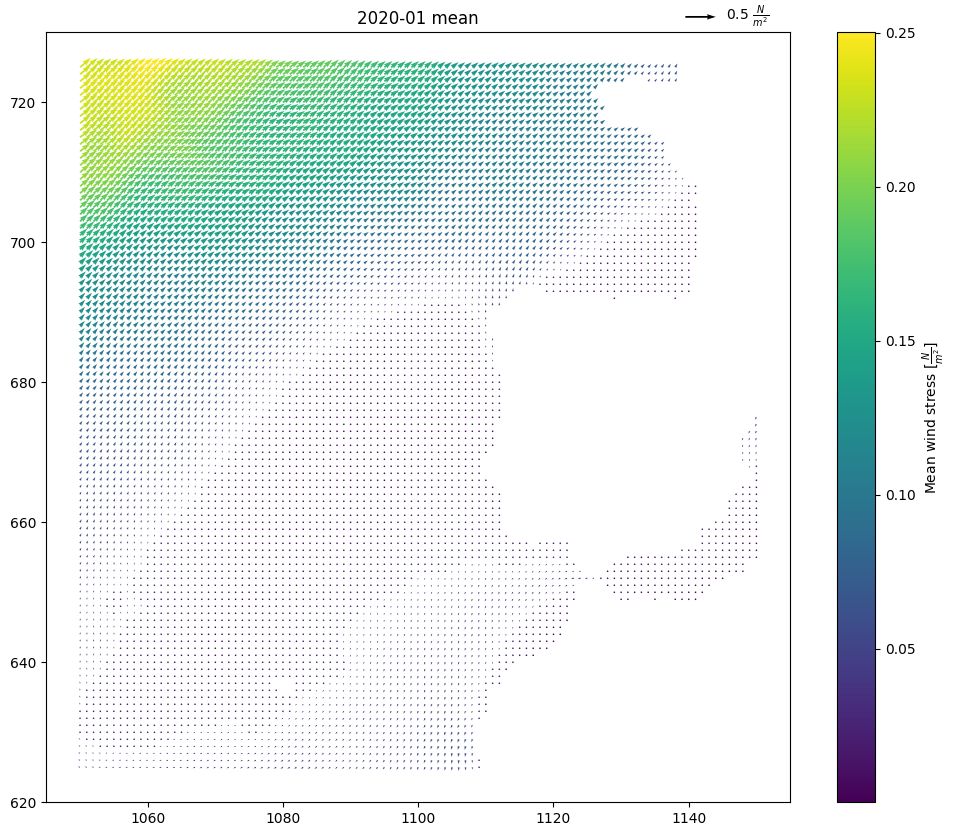

In [161]:
# create subset around Portugal
test_sub = test.sel(lon = slice(1050, 1150), lat = slice (625,725))

plt.figure(figsize = (12,10))

# colour
M = np.hypot(test_sub.x, test_sub.y)

# plot
ax = plt.quiver(test_sub.lon, test_sub.lat, test_sub.x, test_sub.y, M)
qk = plt.quiverkey(ax, 0.9, 1.02, 0.5, r'0.5 $\frac{N}{m^{2}}$', labelpos='E')
plt.title('2020-01 mean')
plt.colorbar(ax, label = r'Mean wind stress [$\frac{N}{m^{2}}$]');
plt.savefig("Figures/ORAS5_2020/ORAS5_2020_01_Portugal.png")


In [184]:
## import data alternative attempt
# try combining whole dataset with 'fake coords'

ORAS5_x = xr.merge([xr.open_dataset(f) for f in glob.glob('../Data/ORAS5/*sozotaux*.nc')])
ORAS5_y = xr.merge([xr.open_dataset(f) for f in glob.glob('../Data/ORAS5/*sometauy*.nc')])

In [180]:
ORAS5_x

<xarray.Dataset> Size: 82MB
Dimensions:            (time_counter: 12, y: 1021, x: 1442, bnds: 2)
Coordinates:
  * time_counter       (time_counter) datetime64[ns] 96B 2020-01-16T12:00:00 ...
    nav_lat            (y, x) float32 6MB -77.01 -77.01 -77.01 ... 49.99 49.99
    nav_lon            (y, x) float32 6MB 72.88 73.12 73.38 ... 73.0 73.0 73.0
Dimensions without coordinates: y, x, bnds
Data variables:
    sozotaux           (time_counter, y, x) float32 71MB nan nan nan ... nan nan
    time_counter_bnds  (time_counter, bnds) datetime64[ns] 192B 2020-01-01 .....
Attributes:
    Conventions:  CF-1.6
    NCO:          netCDF Operators version 4.9.7 (Homepage = http://nco.sf.ne...
    title:        Monthly mean 2D Sea Surface fields
    source:       ORAS5 - backward extension (ECMWF)
    institution:  European Centre for Medium-Range Weather Forecasts (ECMWF) ...
    reference:    https://www.ecmwf.int/en/research/climate-reanalysis/ocean-...

In [198]:
## build a 'fake dataset' with fixed lat and lon values and then fill with the x and y tau values
## get data into xarray with lat lon coordinates for easier use with function

lat = np.arange(0,1021)
lon = np.arange(0,1442)
time = np.arange(1,13)
y = ORAS5_y.sometauy.to_numpy()
x = ORAS5_x.sozotaux.to_numpy()

# build xarray
ORAS5_test = xr.Dataset({
    'y': xr.DataArray(
                data   = y,   # enter data here
                dims   = [ 'time', 'lat', 'lon'],
                coords = {
                    'lat': lat,
                    'lon': lon,
                    'time': time,}, 
                attrs  = {
                    'var': 'sometauy'}
                ),
    'x': xr.DataArray(
                data   = x,   # enter data here
                dims   = ['time', 'lat', 'lon'],
                coords = {
                    'lat': lat,
                    'lon': lon,
                    'time': time,}, 
                attrs  = {
                    'var': 'sozotaux'}
                )
                 },
    attrs = {'example_attr': 'something'}
)

In [199]:
# create subset around Portugal
ORAS5_test_sub = ORAS5_test.sel(lon = slice(1050, 1150), lat = slice (625,725))

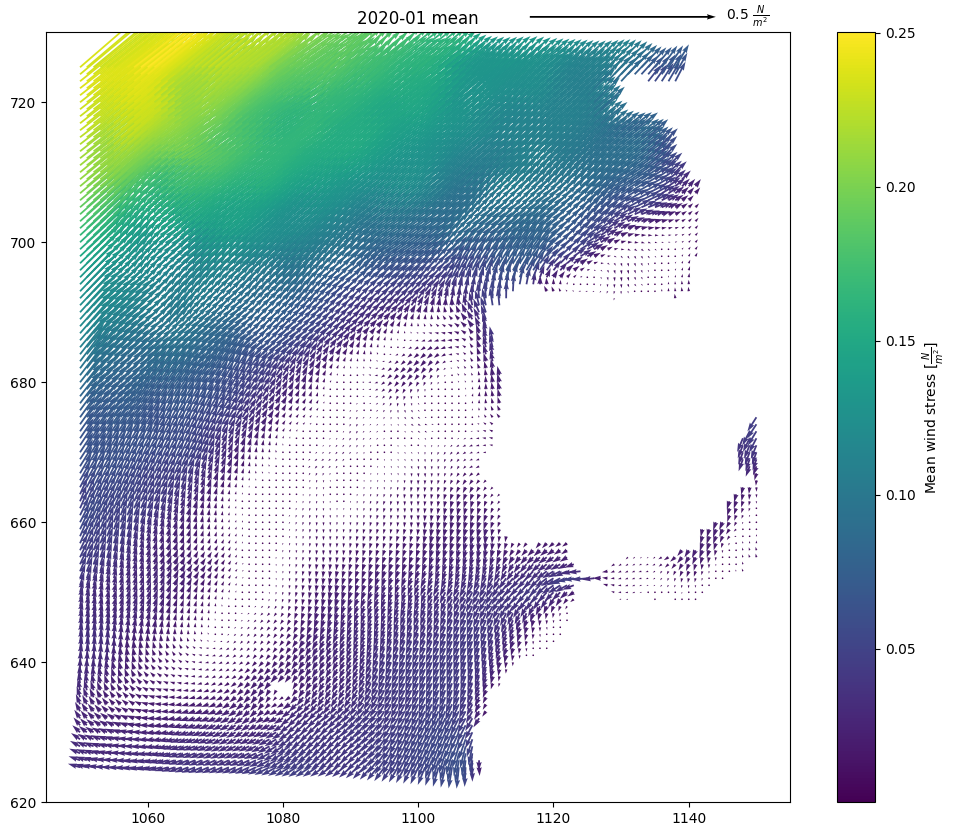

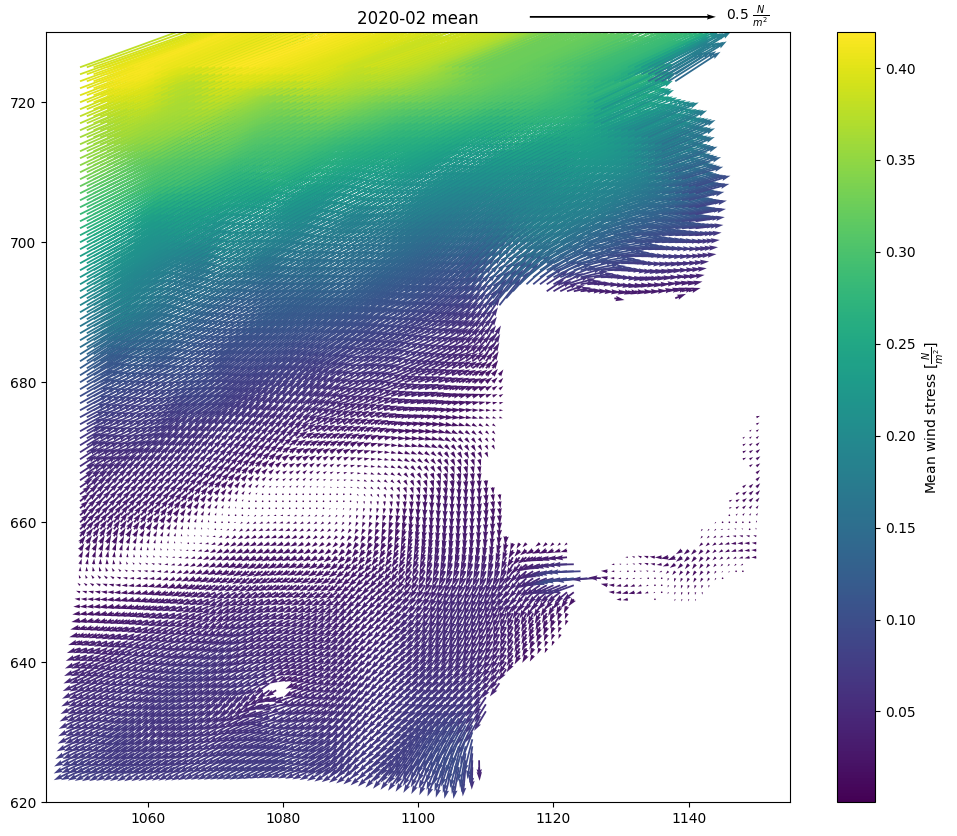

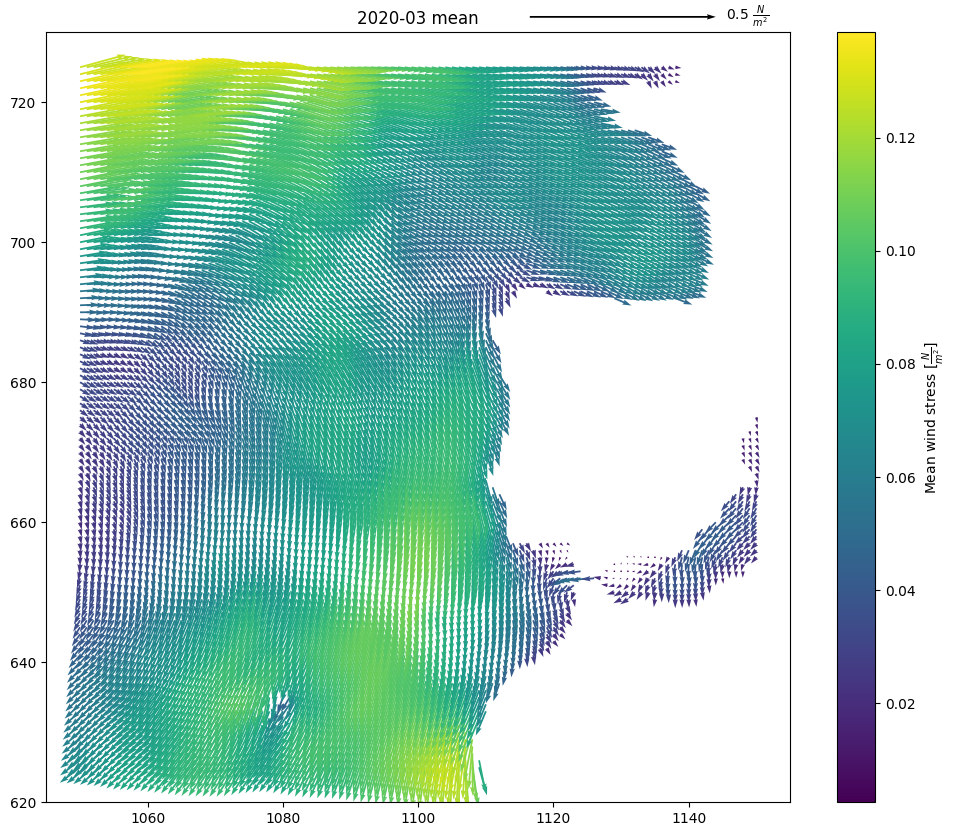

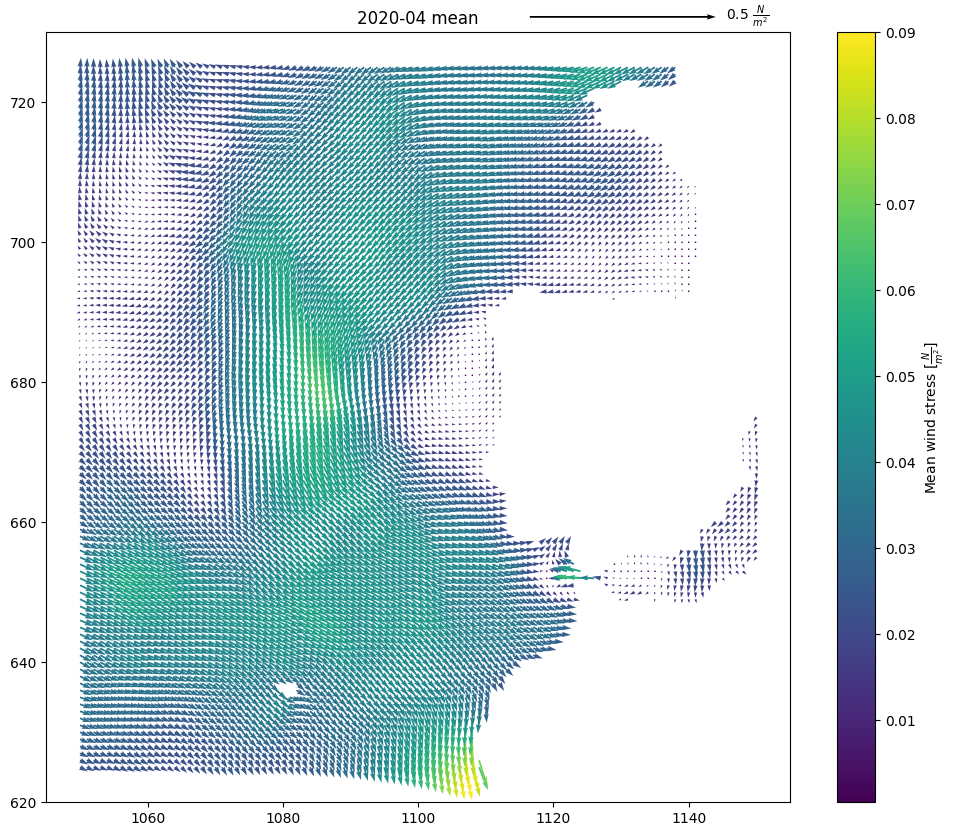

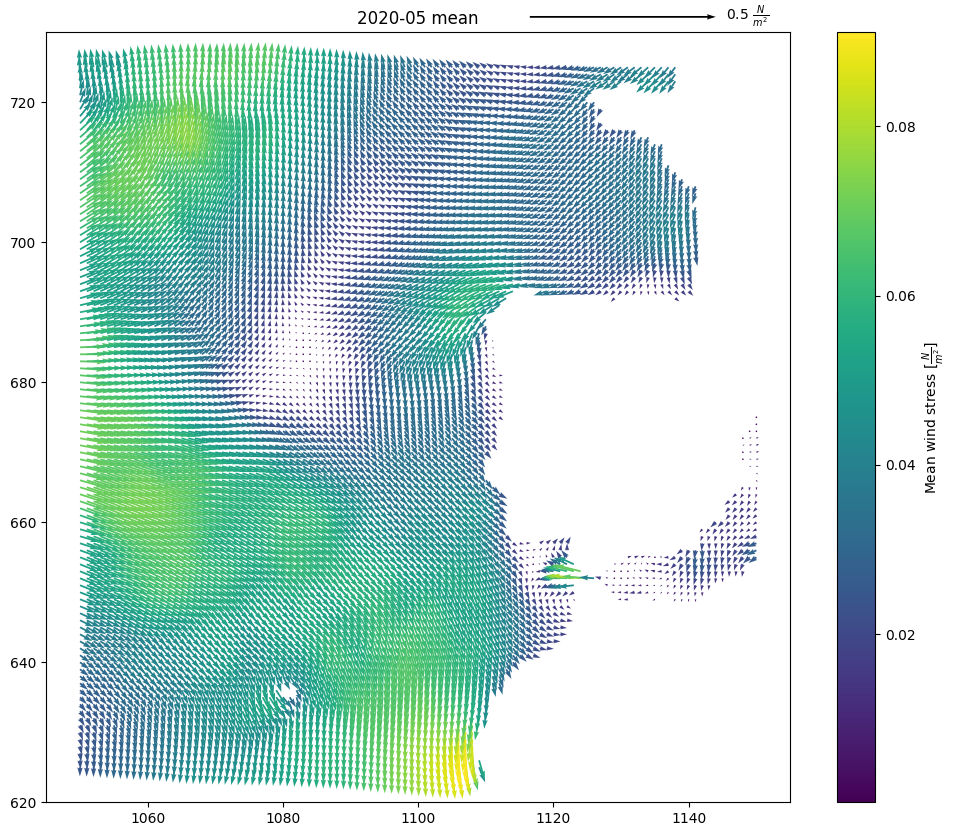

...

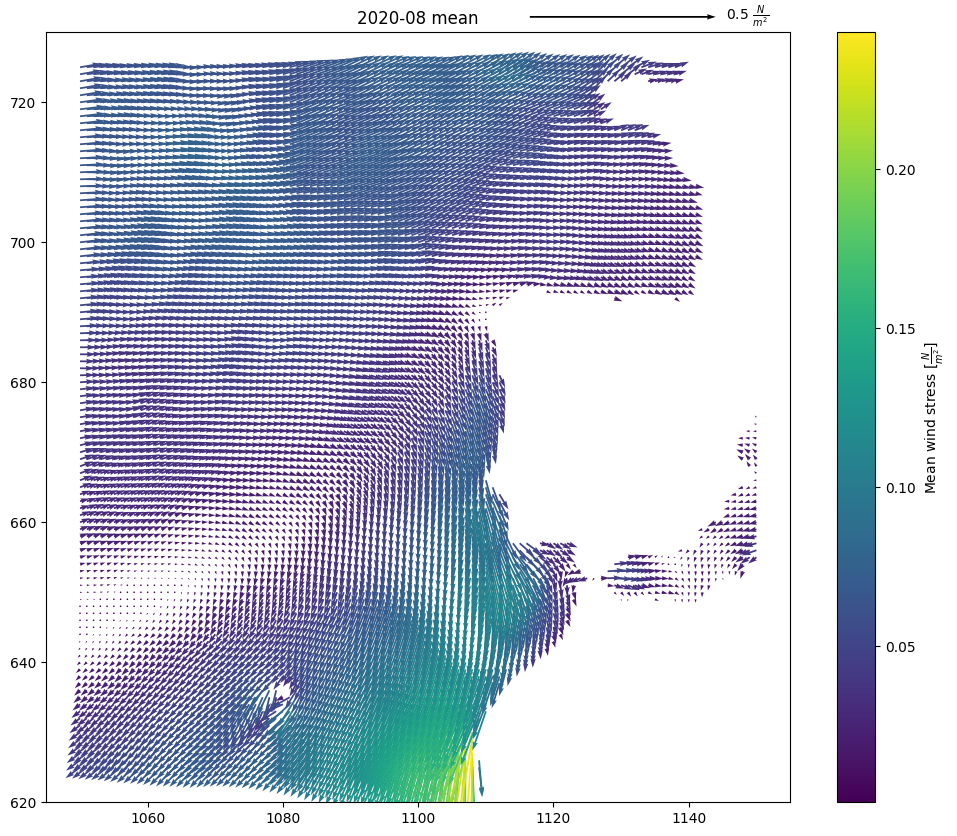

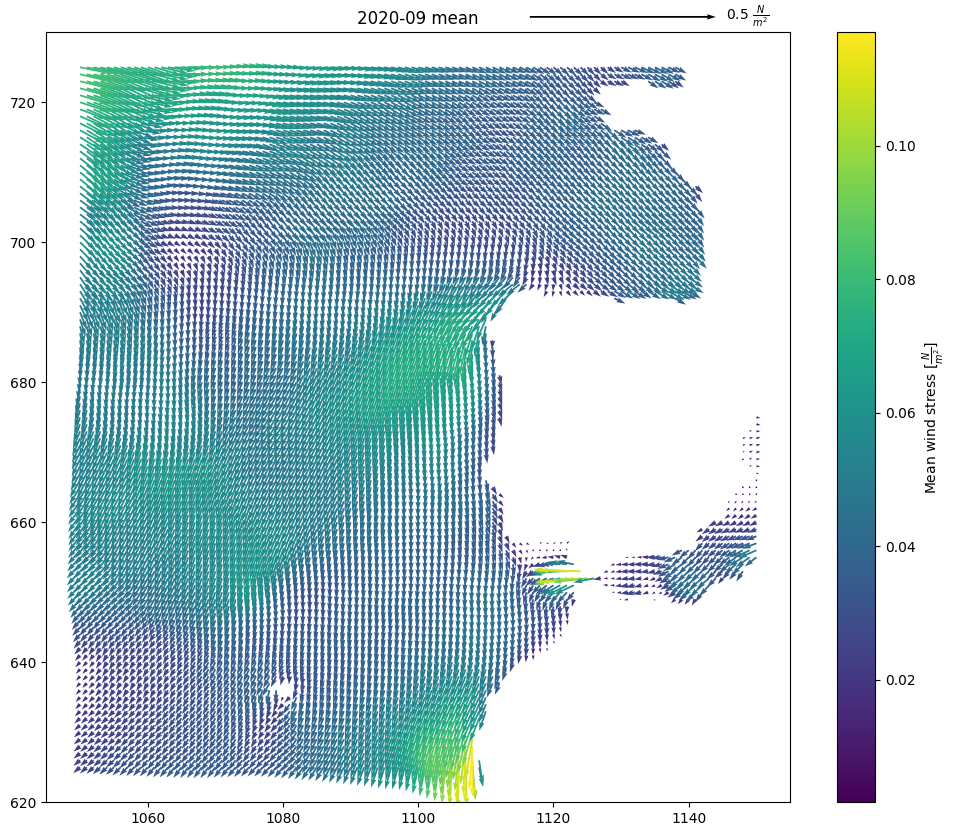

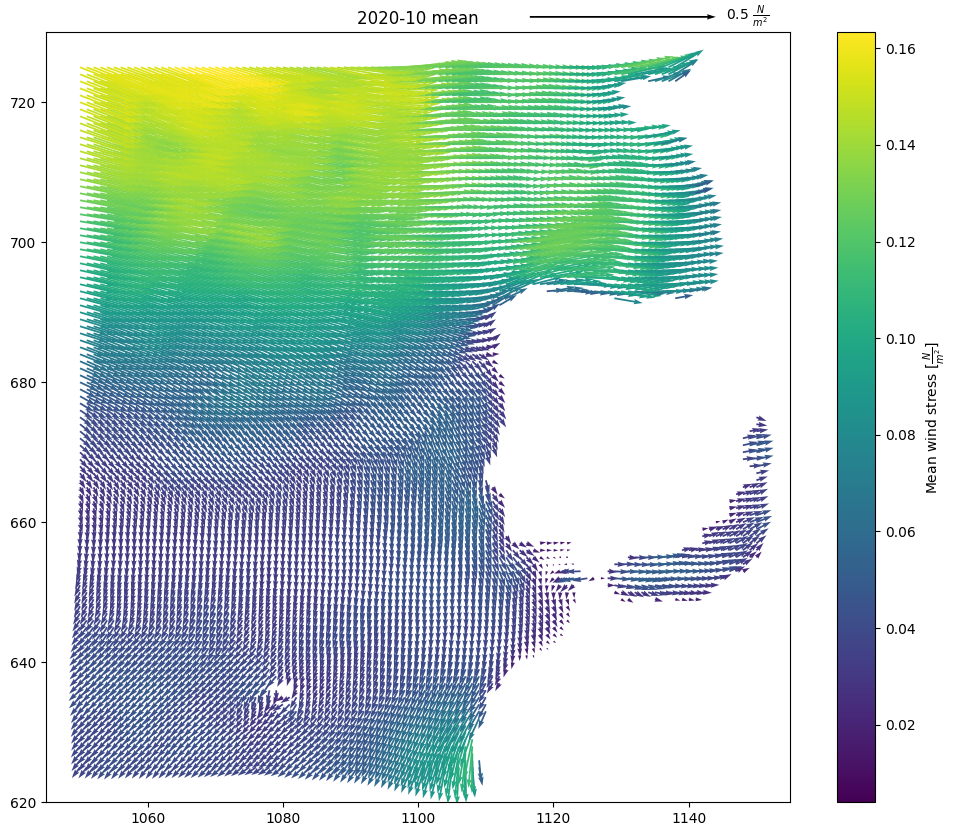

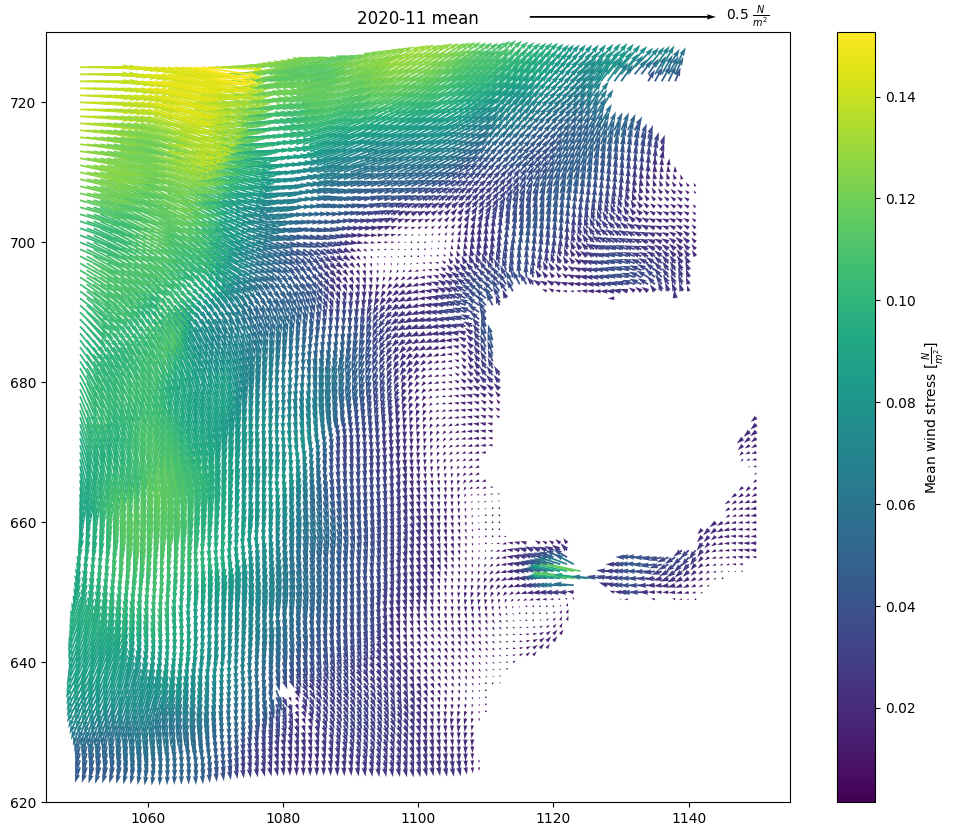

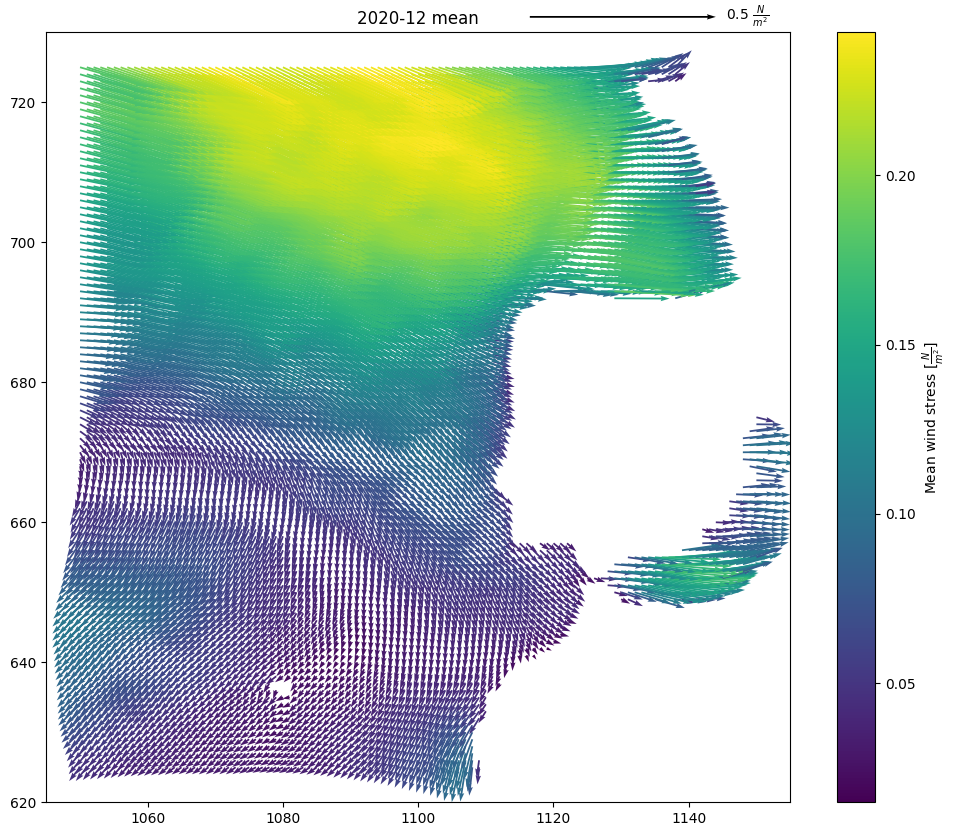

In [217]:
for i in np.arange(1, 13):
    plt.figure(figsize = (12,10))
    
    # colour
    M = np.hypot(ORAS5_test_sub.sel(time = i).x, ORAS5_test_sub.sel(time = i).y)
    
    # plot
    ax = plt.quiver(ORAS5_test_sub.lon, ORAS5_test_sub.lat, ORAS5_test_sub.sel(time = i).x, ORAS5_test_sub.sel(time = i).y, M, scale = 2)
    qk = plt.quiverkey(ax, 0.9, 1.02, 0.5, r'0.5 $\frac{N}{m^{2}}$', labelpos='E')
    plt.title(f'2020-{i:02d} mean')
    plt.colorbar(ax, label = r'Mean wind stress [$\frac{N}{m^{2}}$]');
    plt.savefig(f"Figures/ORAS5_2020/ORAS5_2020_{i:02d}_Portugal.png")

## Climate Energy Indicator (CEI)

In [213]:
## import data
# this is probably useless becaue it is just derived from ERA5 anyway 
# is hourly data
CEI = xr.merge([xr.open_dataset(f) for f in glob.glob('../Data/CEI/*.nc')])

In [214]:
CEI

<xarray.Dataset> Size: 448MB
Dimensions:                  (longitude: 271, latitude: 185, time: 744)
Coordinates:
  * longitude                (longitude) float64 2kB -22.0 -21.75 ... 45.25 45.5
  * latitude                 (latitude) float64 1kB 72.5 72.25 ... 26.75 26.5
  * time                     (time) datetime64[ns] 6kB 2020-01-01 ... 2020-01...
Data variables:
    wofcfr                   (time, latitude, longitude) float32 149MB ...
    var_10_metre_wind_speed  (time, latitude, longitude) float64 298MB ...
Attributes: (12/17)
    NCProperties:           version=1|netcdflibversion=4.6.1|hdf5libversion=1...
    Title:                  C3S-Energy offshore wind power capacity factor, b...
    Calculation_method:     Wind turbine type: Vestas V164/8000 - 8000 kW ins...
    Method_name:            PhM01
    Method_reference:       D426Lot1.WEMC.2.1.2 - Technical description of me...
    Contract:               Official reference number service contract: 2018/...
    ...                     ...
    Forecast_type:          Reanalysis
    Frequency:              01 h
    Resolution:             0.25 deg
    Point_of_contact:       Alberto Troccoli, WEMC, alberto.troccoli@wemcounc...
    Intellectual_Property:  The IP of these data belongs to the EU Copernicus...
    Citation:               Generated using Copernicus Climate Change Service...

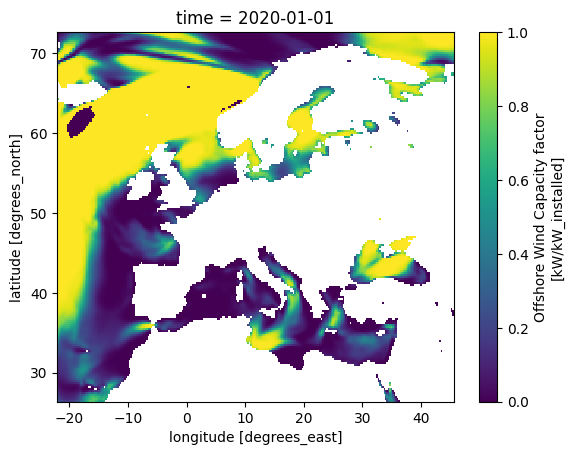

In [215]:
CEI.wofcfr.isel(time=0).plot()

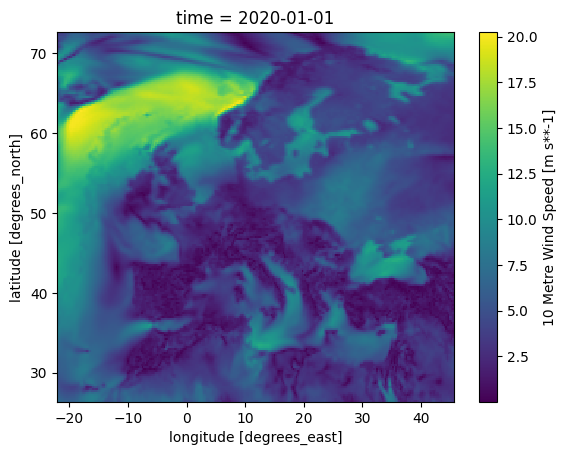

In [216]:
CEI.var_10_metre_wind_speed.isel(time = 0).plot()